In [55]:
%config InlineBackend.figure_format = 'retina'
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(rc={'figure.figsize': (5,3)}, style='ticks', context='talk', font_scale=0.8)

In [56]:
# Load Data

In [57]:
car_adv = pd.read_csv(
    'C:\\Users\\user\\OneDrive - MMU\\Jesty Lab\Assignment\\adverts.csv'
)

## 1.0 Data Understanding and Exploration

### 1.1. Meaning and Type of Features; Analysis of Distributions

#### 1.1.1 Meaning of features

#### The features of the data can be understood using a variety of approaches after the data has been loaded in a DataFrame.
Some common techniques include:

    df.head(): View the initial few rows of DataFrame
    df.info(): View the data types and null values of the columns
    df.describe(): View summary statistics of the numerical columns
    df.value_counts(): View the unique values and their counts for a categorical column

In [58]:
# Sample observations

In [59]:
car_adv.head()

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,NaN,73970,SUV,False,Petrol Plug-in Hybrid
1,202007020778260,108230.0,61,Blue,Jaguar,XF,USED,2011.0,7000,Saloon,False,Diesel
2,202007020778474,7800.0,17,Grey,SKODA,Yeti,USED,2017.0,14000,SUV,False,Petrol
3,202007080986776,45000.0,16,Brown,Vauxhall,Mokka,USED,2016.0,7995,Hatchback,False,Diesel
4,202007161321269,64000.0,64,Grey,Land Rover,Range Rover Sport,USED,2015.0,26995,SUV,False,Diesel


In [60]:
car_adv.sample(10)

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
137196,202009214017754,6132.0,68,White,Audi,A4,USED,2018.0,20999,Saloon,False,Petrol
158603,202010295593111,17539.0,69,Black,Mazda,CX-5,USED,2019.0,20425,SUV,False,Petrol
262964,202010175104534,6670.0,19,White,Mercedes-Benz,E Class,USED,2019.0,31995,Coupe,False,Diesel
69122,202009244141225,31082.0,17,NaN,Volkswagen,Golf,USED,2017.0,17499,Estate,False,Diesel
316350,202008052105442,11685.0,18,Blue,Honda,HR-V,USED,2018.0,17995,SUV,False,Petrol
256844,202008011956727,43000.0,64,Beige,SKODA,Yeti,USED,2014.0,9499,SUV,False,Diesel
290542,202010245374219,25349.0,67,Blue,Kia,Sportage,USED,2017.0,11800,SUV,False,Diesel
121023,202003208619895,3700.0,69,White,Nissan,Micra,USED,2019.0,11985,Hatchback,False,Petrol
54438,202008202705190,5.0,NaN,Purple,Fiat,500,NEW,NaN,11500,Hatchback,False,Petrol
361887,202009183882847,9267.0,19,Blue,SEAT,Ateca,USED,2019.0,18995,SUV,False,Petrol


In [61]:
car_adv.tail()

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
402000,202010315652942,5179.0,69,Grey,Peugeot,208,USED,2019.0,10595,Hatchback,False,Petrol
402001,202010315657341,110000.0,59,Red,Peugeot,107,USED,2009.0,2000,Hatchback,False,Petrol
402002,202010315659271,52760.0,62,White,Nissan,Qashqai,USED,2012.0,7250,SUV,False,Petrol
402003,202011015662436,10250.0,65,Red,Abarth,595,USED,2015.0,11490,Hatchback,False,Petrol
402004,201512149444029,14000.0,14,Silver,Audi,A4 Avant,USED,2014.0,20520,Estate,False,Diesel


#### 1.1.2 Type of features

In [62]:
# Identify quantitative and qualitative features

In [63]:
car_adv.dtypes

public_reference           int64
mileage                  float64
reg_code                  object
standard_colour           object
standard_make             object
standard_model            object
vehicle_condition         object
year_of_registration     float64
price                      int64
body_type                 object
crossover_car_and_van       bool
fuel_type                 object
dtype: object

In [64]:
car_adv.columns

Index(['public_reference', 'mileage', 'reg_code', 'standard_colour',
       'standard_make', 'standard_model', 'vehicle_condition',
       'year_of_registration', 'price', 'body_type', 'crossover_car_and_van',
       'fuel_type'],
      dtype='object')

In [65]:
# Identify numerical columns
numerical_columns = car_adv.select_dtypes(include=['int64', 'float64']).columns
numerical_columns

Index(['public_reference', 'mileage', 'year_of_registration', 'price'], dtype='object')

In [66]:
# Identify categorical columns
car_adv.select_dtypes(include=['object']).columns

Index(['reg_code', 'standard_colour', 'standard_make', 'standard_model',
       'vehicle_condition', 'body_type', 'fuel_type'],
      dtype='object')

In [67]:
car_adv.index

RangeIndex(start=0, stop=402005, step=1)

In [68]:
car_adv.shape

(402005, 12)

In [69]:
len(car_adv)

402005

In [70]:
# Analyse data distributions

In [71]:
# Calculate the range
range = car_adv[numerical_columns].max() - car_adv[numerical_columns].min()
range

public_reference        7.038478e+11
mileage                 9.999990e+05
year_of_registration    1.021000e+03
price                   9.999879e+06
dtype: float64

In [72]:
# Calculate the mean
mean = car_adv[numerical_columns].mean()
mean

public_reference        2.020071e+14
mileage                 3.774360e+04
year_of_registration    2.015006e+03
price                   1.734197e+04
dtype: float64

In [73]:
# Calculate the median
median = car_adv[numerical_columns].median()
median

public_reference        2.020093e+14
mileage                 2.862950e+04
year_of_registration    2.016000e+03
price                   1.260000e+04
dtype: float64

In [74]:
## Calculate the variance 
var = car_adv[numerical_columns].var()
var

public_reference        2.861719e+20
mileage                 1.213249e+09
year_of_registration    6.340407e+01
price                   2.156438e+09
dtype: float64

In [75]:
# Calculate the standard deviation
std = car_adv[numerical_columns].std()
std

public_reference        1.691662e+10
mileage                 3.483172e+04
year_of_registration    7.962667e+00
price                   4.643746e+04
dtype: float64

#### 1.1.3 Analysis of distribution

##### The describe() function can be used to view the target column's summary statistics. In this dataset the target column is 'price'. The value counts() method can be used to view the unique values and their counts of categorical column. To understand and explore the data, data visualisation can be a powerful resource.Box plot, histograms, scatter plots, and bar plots can all be made using the matplotlib or seaborn libraries. 

In [76]:
car_adv['price'].describe()

count    4.020050e+05
mean     1.734197e+04
std      4.643746e+04
min      1.200000e+02
25%      7.495000e+03
50%      1.260000e+04
75%      2.000000e+04
max      9.999999e+06
Name: price, dtype: float64

In [77]:
car_adv['fuel_type'].value_counts()

Petrol                   216929
Diesel                   158120
Petrol Hybrid             13602
Petrol Plug-in Hybrid      6160
Electric                   4783
Diesel Hybrid              1403
Bi Fuel                     221
Diesel Plug-in Hybrid       185
Natural Gas                   1
Name: fuel_type, dtype: int64

In [78]:
car_adv['standard_make'].value_counts()

BMW               37376
Audi              35280
Volkswagen        34246
Vauxhall          33700
Mercedes-Benz     31917
                  ...  
Bristol               1
Wolseley              1
Pagani                1
International         1
Custom Vehicle        1
Name: standard_make, Length: 110, dtype: int64

#### 1.1.3.1 Analysis of distribution of numerical features

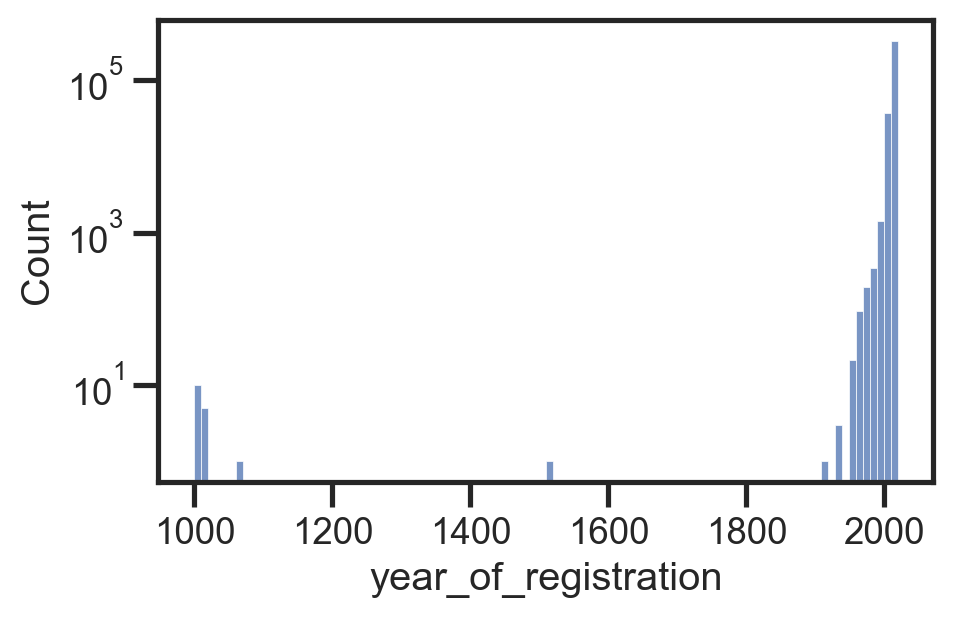

In [79]:
bx=sns.histplot(data=car_adv, x='year_of_registration', bins=100)
bx.set_yscale('log')

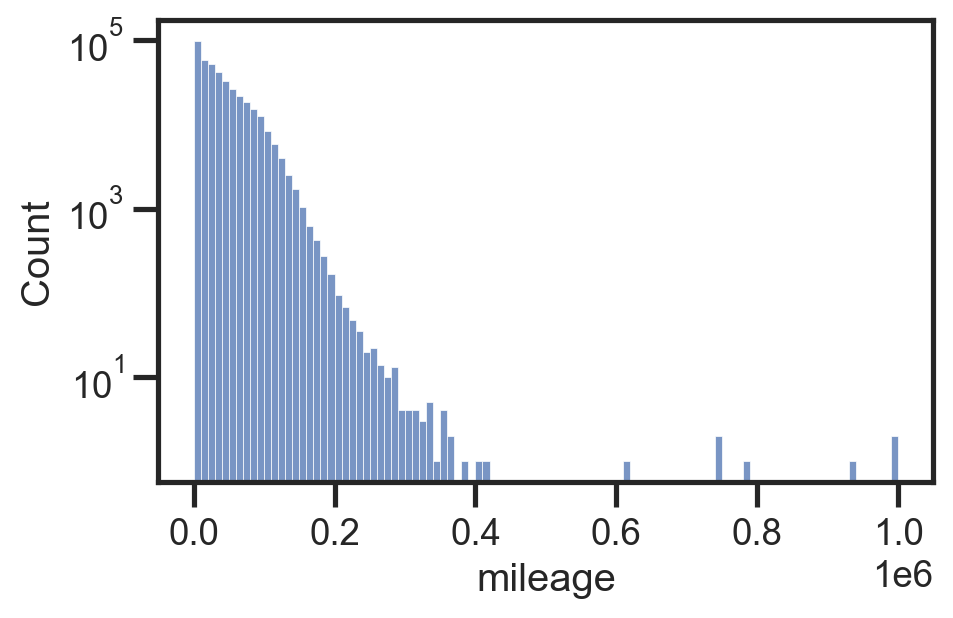

In [80]:
bx=sns.histplot(data=car_adv, x='mileage', bins=100)
bx.set_yscale('log')

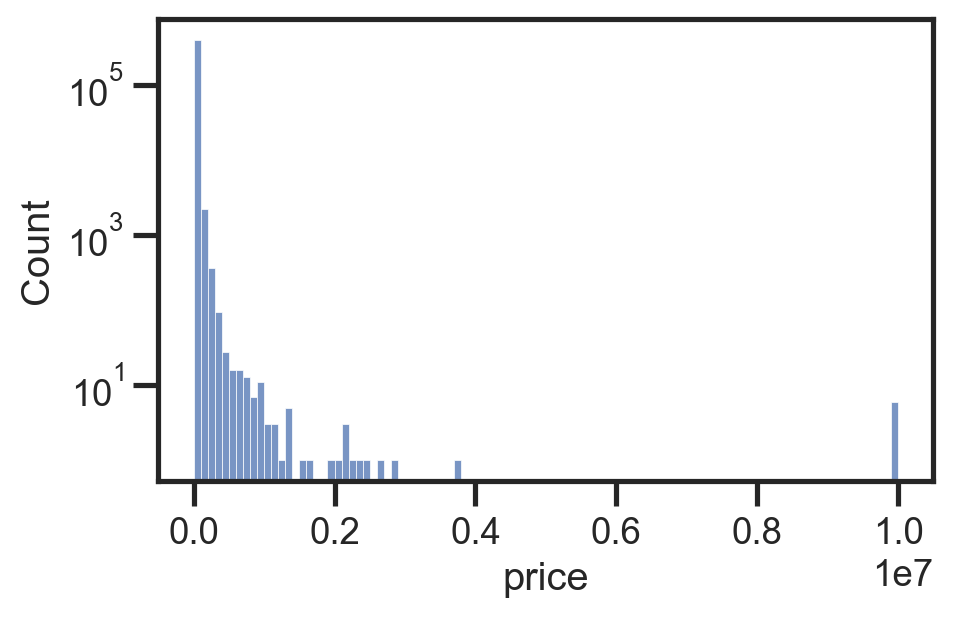

In [81]:
bx=sns.histplot(data=car_adv, x='price', bins=100)
bx.set_yscale('log')

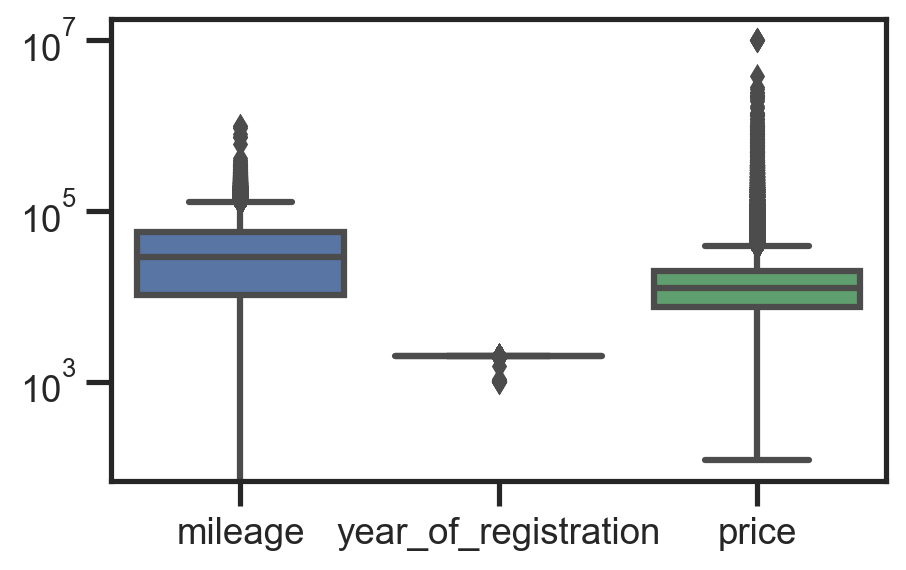

In [82]:
box = sns.boxplot(data = car_adv[['mileage', 'year_of_registration', 'price']])
box.set_yscale('log')

#### 1.1.3.2 Analysis of distribution of categorical features

<AxesSubplot:>

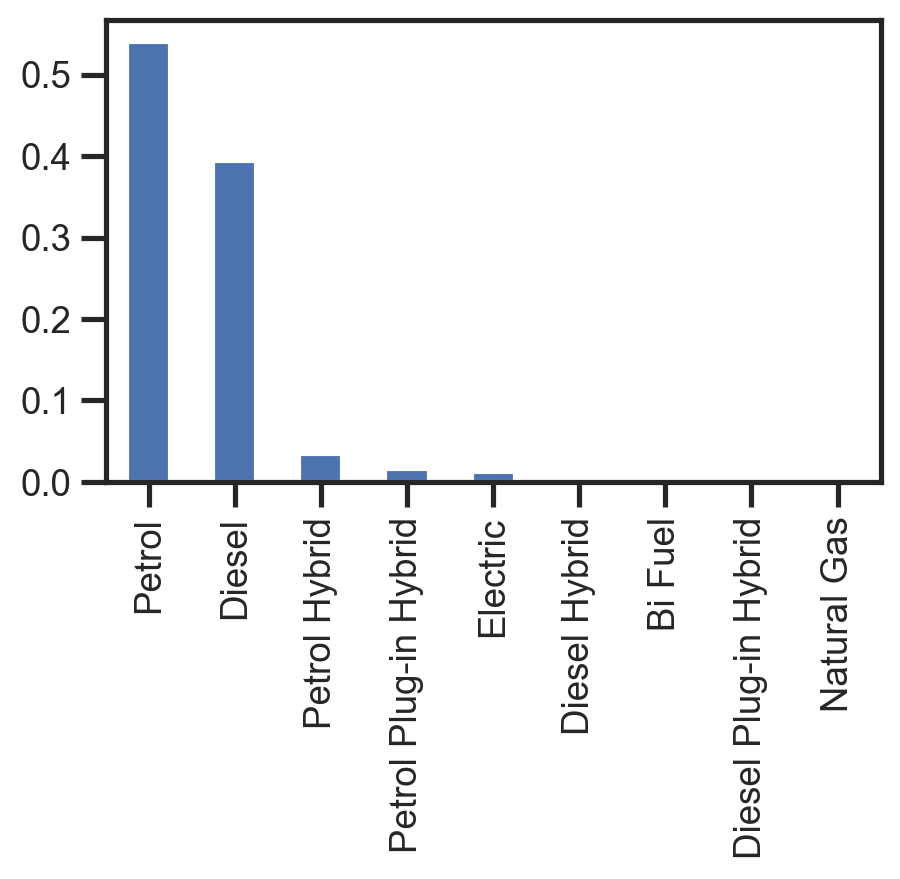

In [83]:
car_adv['fuel_type'].value_counts(normalize=True).plot.bar()

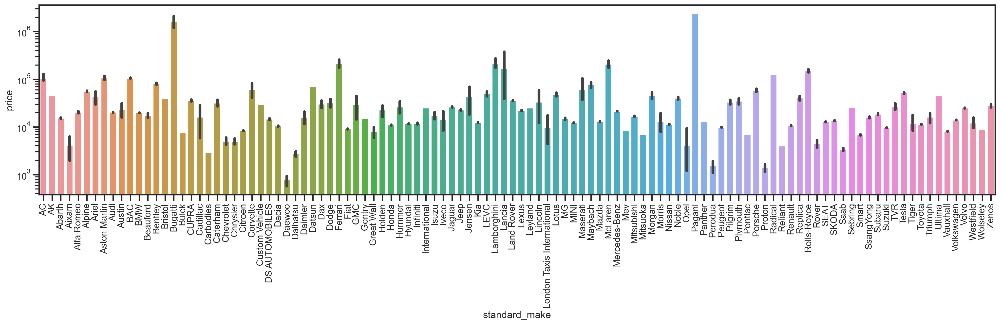

In [84]:
plt.figure(figsize=(25, 5))
sns.barplot(x='standard_make', y='price', data=car_adv.sort_values(by='standard_make'))
plt.xticks(rotation=90)
plt.yscale('log')


<AxesSubplot:>

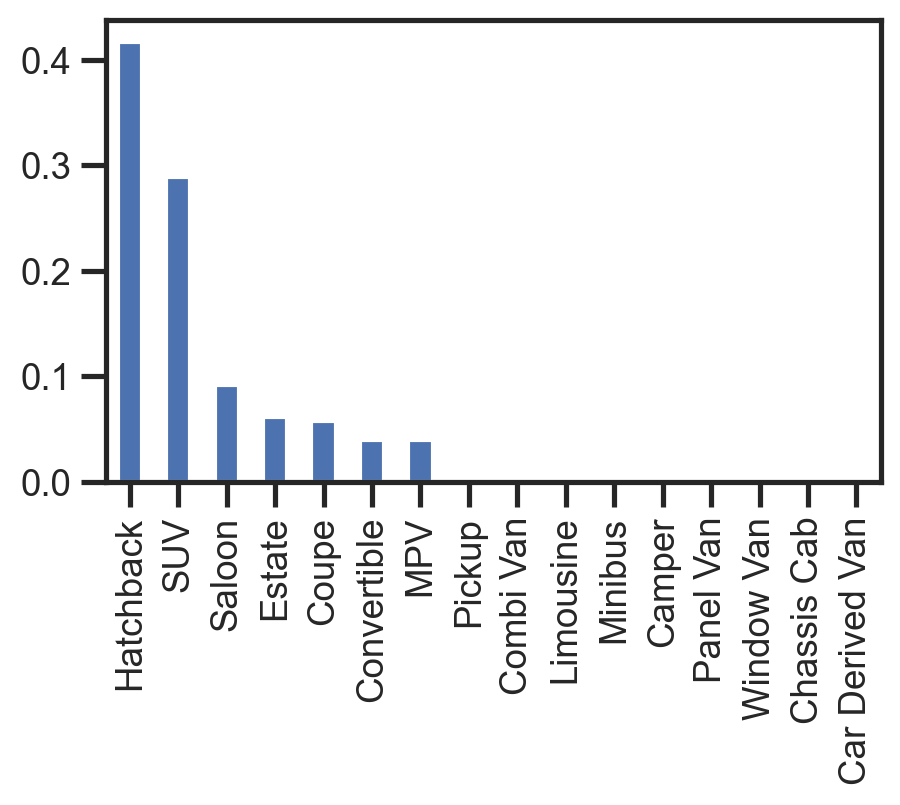

In [85]:
car_adv['body_type'].value_counts(normalize=True).plot.bar()

<AxesSubplot:>

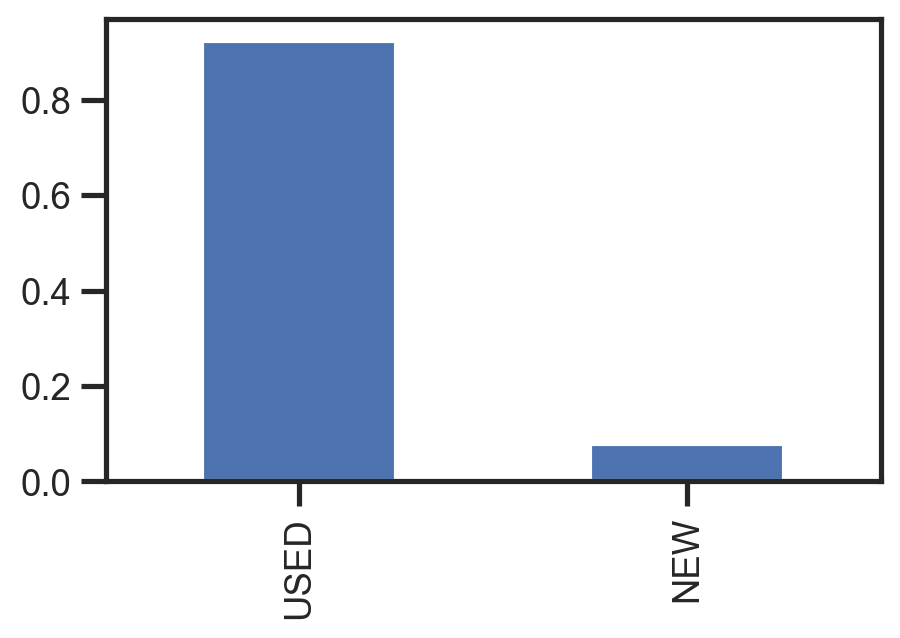

In [86]:
car_adv['vehicle_condition'].value_counts(normalize=True).plot.bar()

<AxesSubplot:>

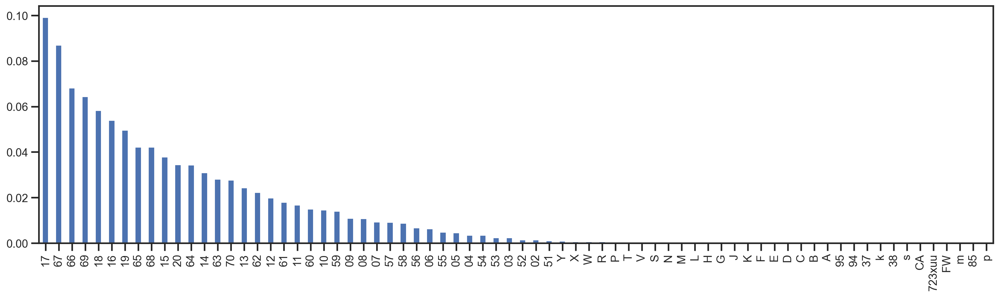

In [87]:
plt.figure(figsize=(20, 5))
car_adv['reg_code'].value_counts(normalize=True).plot.bar()

#### 1.1.4 Data visualization

<AxesSubplot:xlabel='year_of_registration', ylabel='price'>

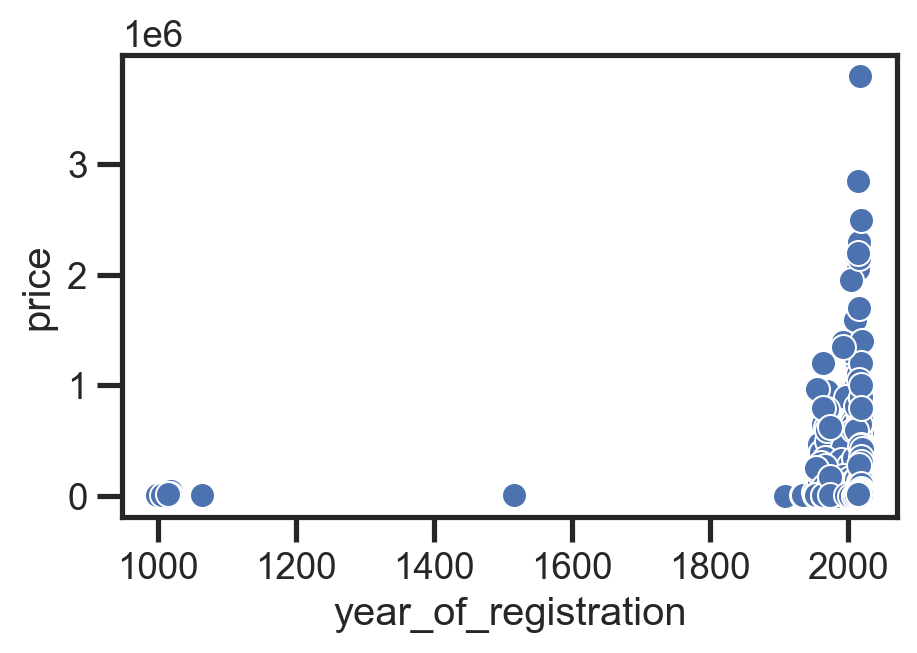

In [88]:
sns.scatterplot(data=car_adv, y = "price", x = "year_of_registration")

<AxesSubplot:xlabel='mileage', ylabel='price'>

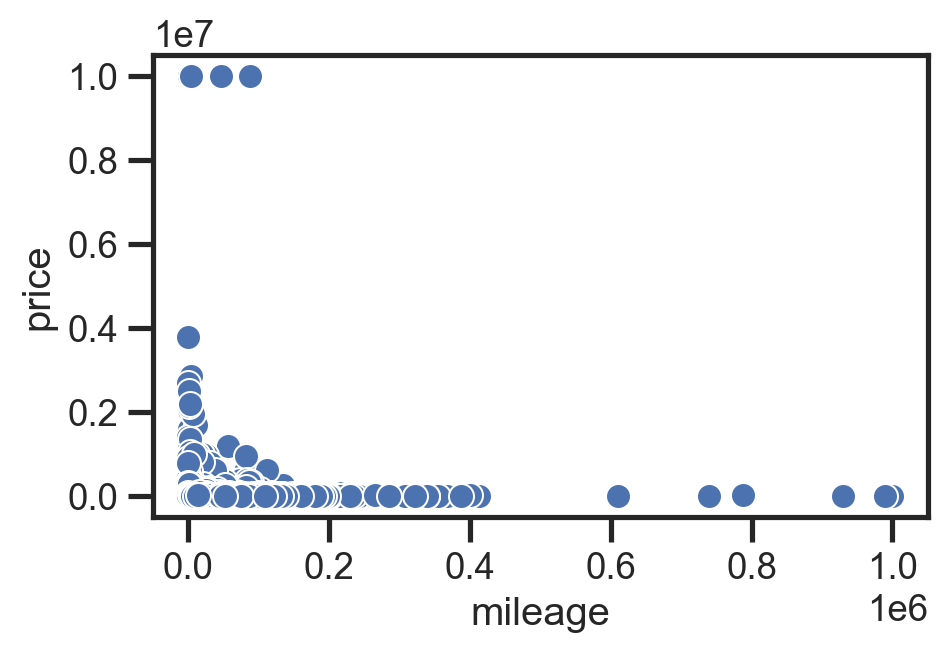

In [89]:
sns.scatterplot(data=car_adv, y = "price", x = "mileage")

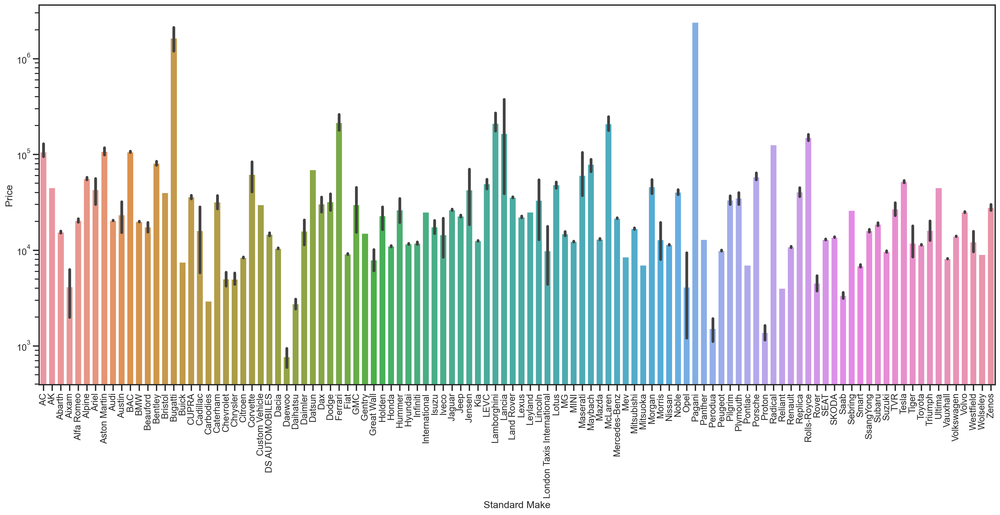

In [90]:
plt.figure(figsize=(25, 10))
sns.barplot(x='standard_make', y='price', data=car_adv.sort_values(by='standard_make'))
plt.xticks(rotation=90)
plt.yscale('log')
plt.ylabel('Price')
plt.xlabel('Standard Make');

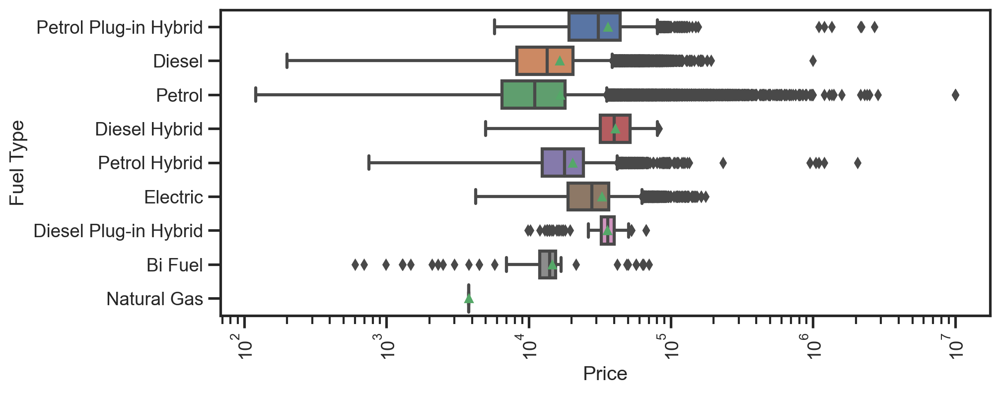

In [91]:
plt.figure(figsize=(10, 4))
bxplt1 = sns.boxplot(y='fuel_type', x='price', showmeans=True, data=car_adv)
plt.xticks(rotation=90)
bxplt1.set_xscale('log')
bxplt1.set_xlabel('Price')
bxplt1.set_ylabel('Fuel Type');

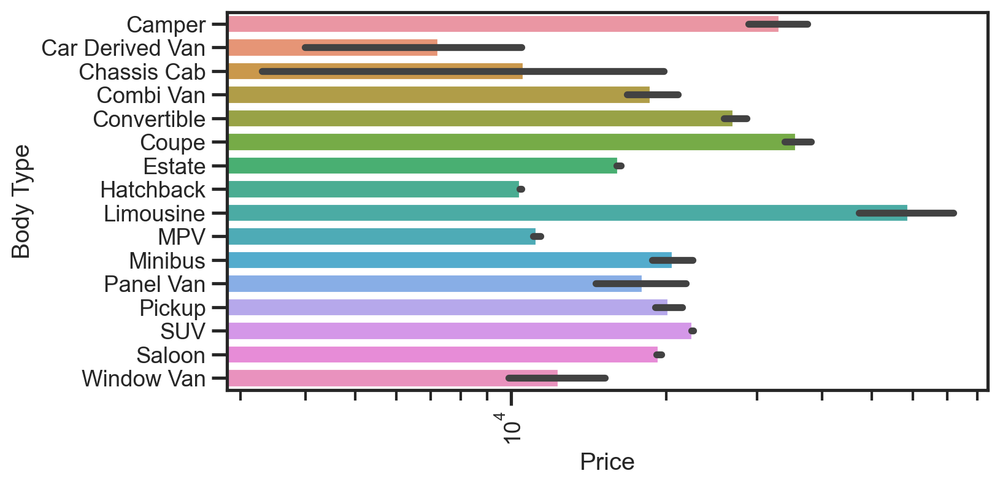

In [92]:
plt.figure(figsize=(8, 4))
sns.barplot(y='body_type', x='price', data=car_adv.sort_values(by='body_type'))
plt.xticks(rotation=90)
plt.xscale('log')
plt.ylabel('Body Type')
plt.xlabel('Price');


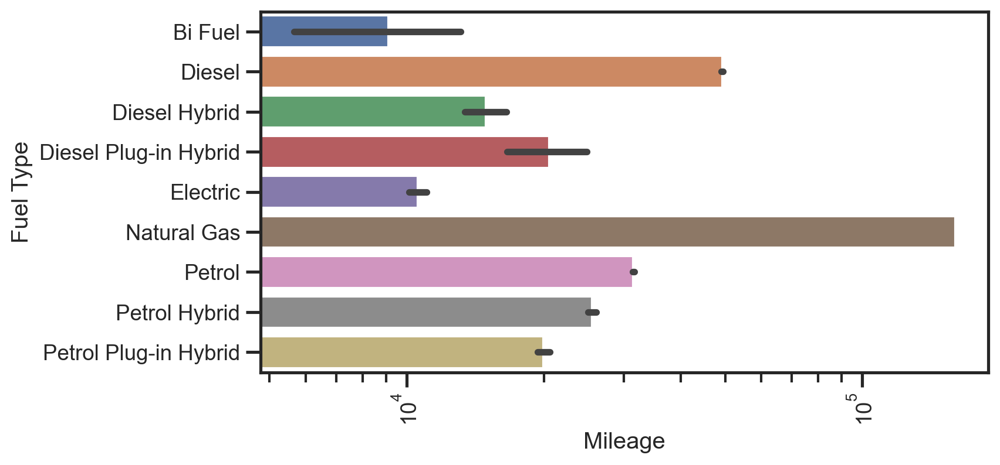

In [93]:
plt.figure(figsize=(8, 4))
plt2 = sns.barplot(y='fuel_type', x='mileage', data=car_adv.sort_values(by='fuel_type'))
plt.xticks(rotation=90)
plt2.set_xscale('log')
plt2.set_ylabel('Fuel Type')
plt2.set_xlabel('Mileage');

Text(0.5, 0, 'Vehicle Condition')

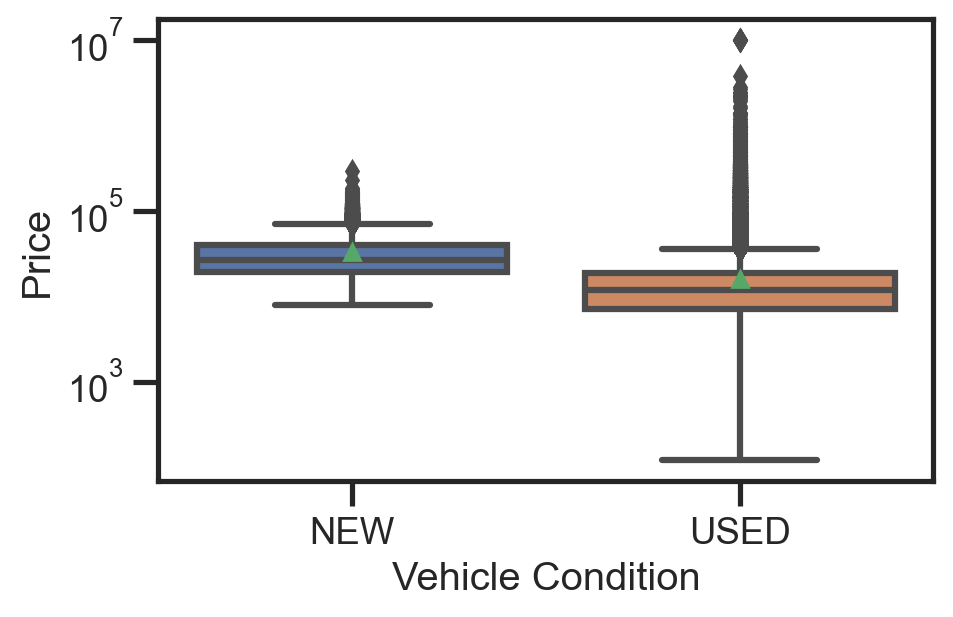

In [94]:
bxplt3 = sns.boxplot(x='vehicle_condition', y='price', showmeans=True, data=car_adv)
bxplt3.set_yscale('log')
bxplt3.set_ylabel('Price')
bxplt3.set_xlabel('Vehicle Condition')

### 1.2. Identification/Commenting on Missing Values

It's crucial to recognise and deal with missing values in a dataset since they might significantly affect the analysis's precision and interpretability. Identifying missing values in a dataset can be done in a number of ways as follows.

* Heat map

In [95]:
car_adv.isnull().sum()

public_reference             0
mileage                    127
reg_code                 31857
standard_colour           5378
standard_make                0
standard_model               0
vehicle_condition            0
year_of_registration     33311
price                        0
body_type                  837
crossover_car_and_van        0
fuel_type                  601
dtype: int64

In [96]:
car_adv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 402005 entries, 0 to 402004
Data columns (total 12 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   public_reference       402005 non-null  int64  
 1   mileage                401878 non-null  float64
 2   reg_code               370148 non-null  object 
 3   standard_colour        396627 non-null  object 
 4   standard_make          402005 non-null  object 
 5   standard_model         402005 non-null  object 
 6   vehicle_condition      402005 non-null  object 
 7   year_of_registration   368694 non-null  float64
 8   price                  402005 non-null  int64  
 9   body_type              401168 non-null  object 
 10  crossover_car_and_van  402005 non-null  bool   
 11  fuel_type              401404 non-null  object 
dtypes: bool(1), float64(2), int64(2), object(7)
memory usage: 34.1+ MB


<AxesSubplot:>

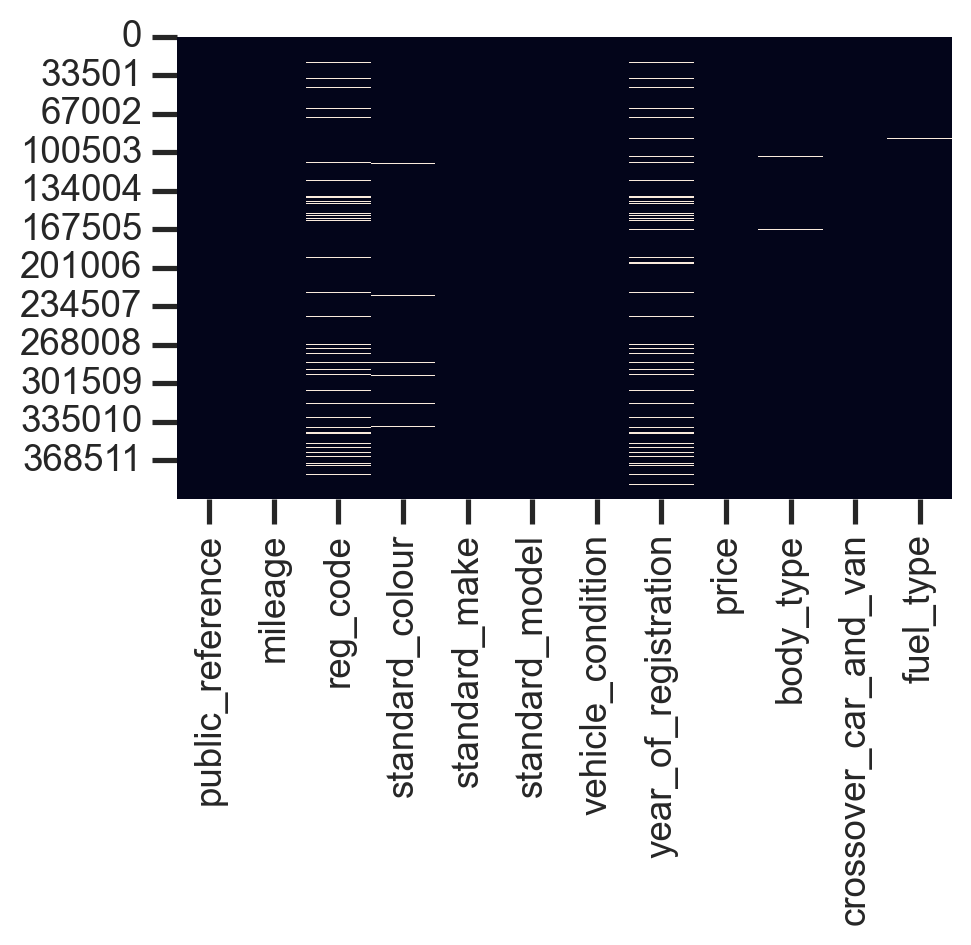

In [97]:
sns.heatmap(car_adv.isna(), cbar=False)

### 1.3. Identification/Commenting on Outliers and Noise

##### It's critical to recognise and deal with outliers and noise in a way that preserves the analysis' accuracy and interpretability. There are a number of approaches to spot outliers and noise in a dataset, including the following.

#### 1.3.1 Identification/Commenting on Outliers

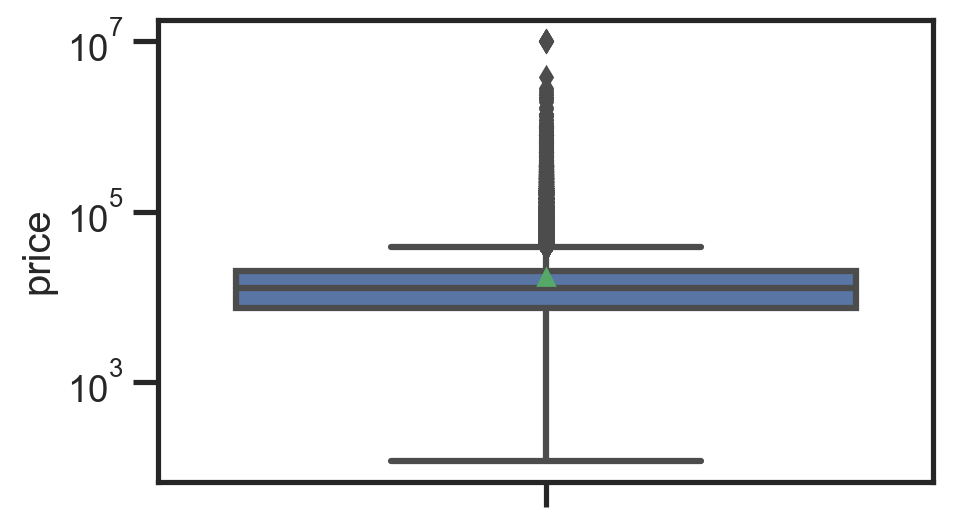

In [98]:
outlier1 = sns.boxplot(y='price', showmeans=True, data=car_adv)
outlier1.set_yscale('log')

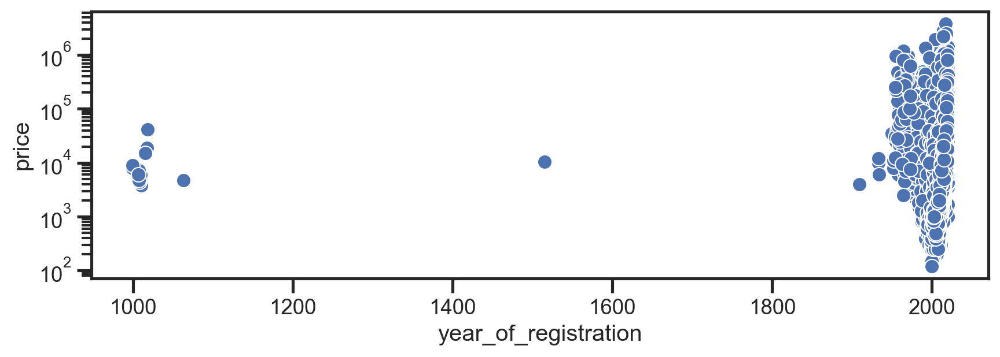

In [99]:
plt.figure(figsize=(10, 3))
sns.scatterplot(data=car_adv, y = "price", x = "year_of_registration").set_yscale('log')

<AxesSubplot:xlabel='mileage'>

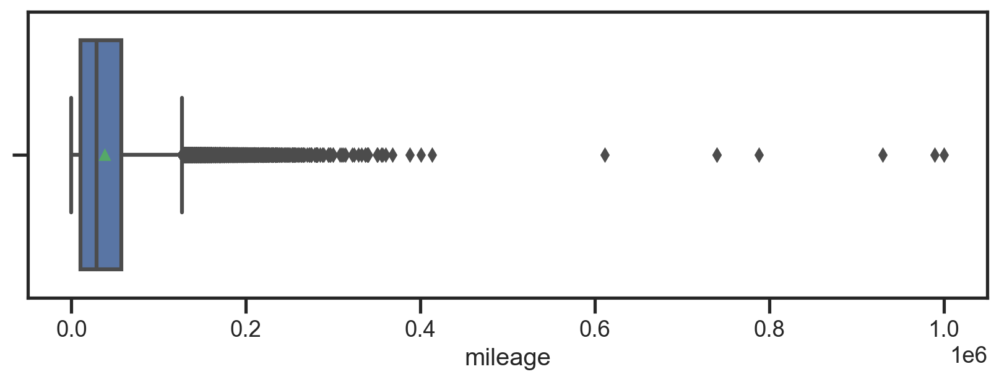

In [100]:
plt.figure(figsize=(10, 3))
sns.boxplot(x='mileage', showmeans=True, data=car_adv)

#### 1.3.2 Identification/Commenting on Noice

In [101]:
car_adv.duplicated().sum()

0

## 2.0 Data Processing

### 2.1. Dealing with Missing Values, Outliers, and Noise

* Replacing missing values and removing the outliers in mileage

In [102]:
car_adv.loc[:, 'mileage'] = (
    car_adv
    .loc[:, 'mileage']
    .fillna(car_adv.loc[:, 'mileage'].mean())
)


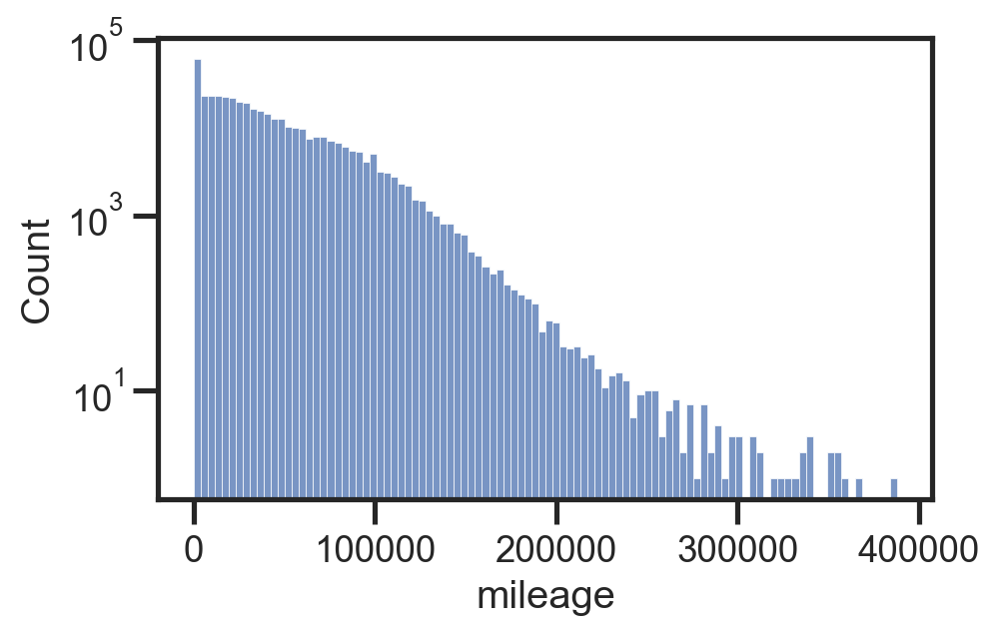

In [103]:
car_adv = car_adv.drop(car_adv[car_adv['mileage'] > 400000].index, axis=0)
sns.histplot(data=car_adv, x='mileage', bins=100).set_yscale('log')

* Replacing missing values and outliers in year of registration

In [104]:
# Defining a function to find year_of_registration
def find_year(year_of_registration,reg_code,vehicle_condition):
    if(vehicle_condition!="NEW"):
        if reg_code.isdigit():
            if 0< int(reg_code) < 23 :
                out = int(reg_code)+2000
            elif 23 <= int(reg_code) < 73:
                out = int(reg_code)+1950 
            else: 
                  out=year_of_registration
        else:
            out=year_of_registration
    else :
            out=year_of_registration
    return out

# Calling the function
car_adv['year_of_registration'] =car_adv.apply(lambda x: find_year((x['year_of_registration']),str(x['reg_code']),(x['vehicle_condition'])), axis=1)


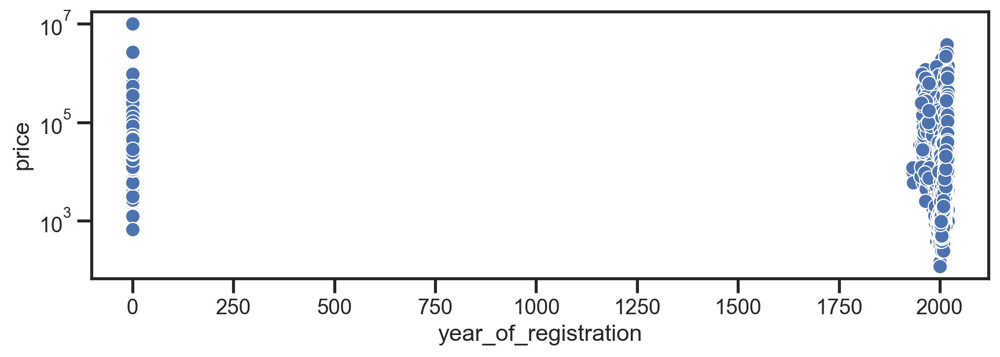

In [105]:
# Replacing the missing values with zero
car_adv['year_of_registration'] = car_adv['year_of_registration'].fillna(0)
plt.figure(figsize=(10, 3))
sns.scatterplot(data=car_adv, y = "price", x = "year_of_registration").set_yscale('log')

* Replacing missing values in categorical features with mode value

In [106]:
car_adv[['fuel_type','standard_colour','body_type']].mode()

,fuel_type,standard_colour,body_type
0,Petrol,Black,Hatchback


In [107]:
car_adv['fuel_type'] = car_adv['fuel_type'].fillna(car_adv['fuel_type'].mode().iloc[0])
car_adv['standard_colour'] = car_adv['standard_colour'].fillna(car_adv['standard_colour'].mode().iloc[0])
car_adv['body_type'] = car_adv['body_type'].fillna(car_adv['body_type'].mode().iloc[0])
car_adv.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 401996 entries, 0 to 402004
Data columns (total 12 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   public_reference       401996 non-null  int64  
 1   mileage                401996 non-null  float64
 2   reg_code               370139 non-null  object 
 3   standard_colour        401996 non-null  object 
 4   standard_make          401996 non-null  object 
 5   standard_model         401996 non-null  object 
 6   vehicle_condition      401996 non-null  object 
 7   year_of_registration   401996 non-null  float64
 8   price                  401996 non-null  int64  
 9   body_type              401996 non-null  object 
 10  crossover_car_and_van  401996 non-null  bool   
 11  fuel_type              401996 non-null  object 
dtypes: bool(1), float64(2), int64(2), object(7)
memory usage: 37.2+ MB


<AxesSubplot:>

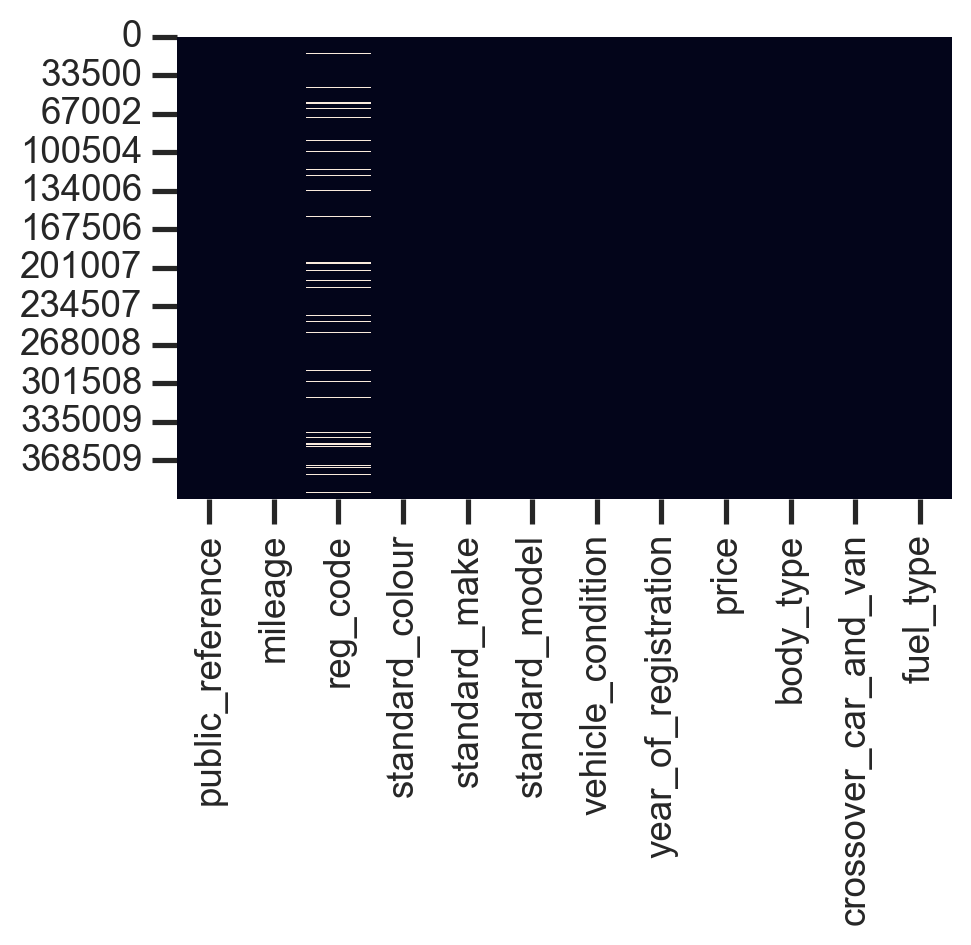

In [108]:
sns.heatmap(car_adv.isna(), cbar=False)

### 2.2 Feature Engineering, Data Transformations

* Creating new features

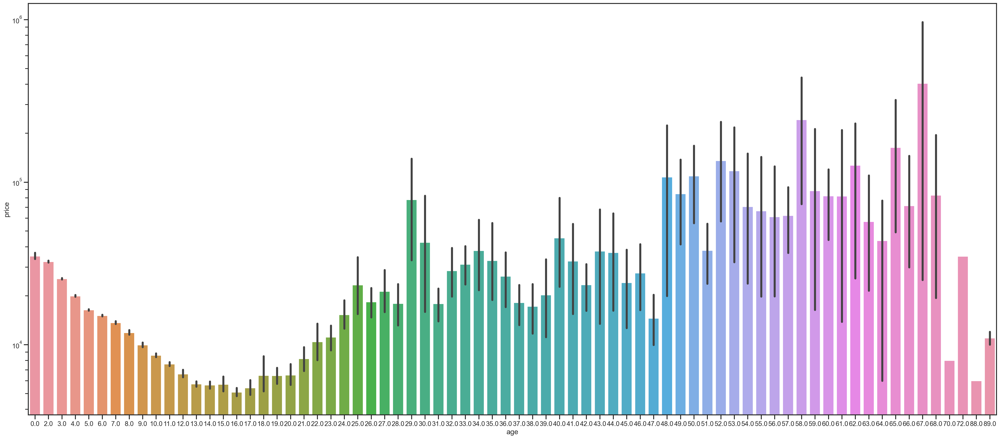

In [109]:
def age(year_of_registration):
    if (year_of_registration == 0):
        out = 0
    else:
        out = 2022-year_of_registration
    return out
car_adv['age'] = car_adv.apply(lambda x: age((x['year_of_registration'])), axis=1)
plt.figure(figsize=(35, 15))
age_plt=sns.barplot(x='age', y='price', data=car_adv)
age_plt.set_yscale('log')



In [110]:
def vehicle_condition(vehicle_condition, age, mileage):
    if (vehicle_condition == "USED"):
        if age <= 15 and mileage <=150000:
            return 1
        elif 15 <= age <= 25 and (0 < mileage < 500000):
            return 2
        else:
            return 3
    else:
        return 0
car_adv["condition"] = car_adv.apply(lambda x: vehicle_condition((x['vehicle_condition']),
                                                                 (x['age']),(x['mileage'])), axis=1)
car_adv.sample(1)


,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,age,condition
197204,202010104846576,33994.0,66,Red,SKODA,Rapid Spaceback,USED,2016.0,9495,Hatchback,False,Petrol,6.0,1


* Dropping unnecessory columns

In [111]:
car_adv = car_adv.drop(labels=['public_reference','reg_code','vehicle_condition','standard_model'], axis=1)
car_adv.sample(1)

,mileage,standard_colour,standard_make,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,age,condition
151656,120167.0,Silver,Vauxhall,2011.0,1800,Hatchback,False,Petrol,11.0,1


* Data Transformation using natural logarithm

A typical transformation to alter a variable's distribution is the natural logarithm, especially when the distribution of the value is skewed. 

<AxesSubplot:xlabel='mileage', ylabel='Count'>

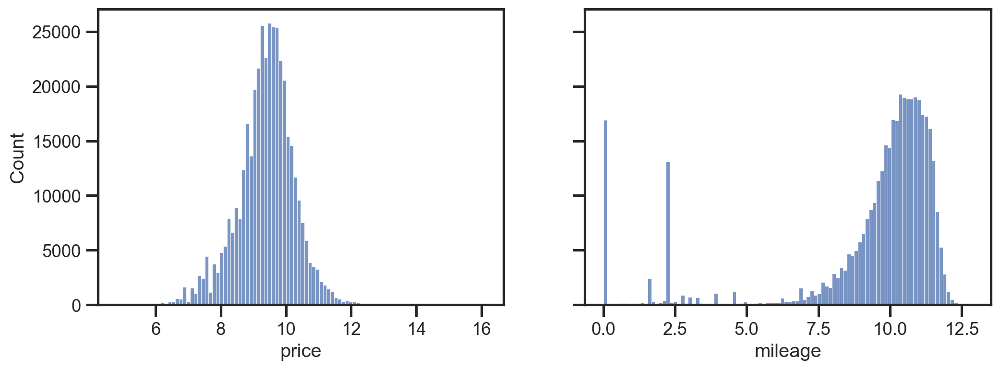

In [112]:
def mileage(mileage):
    if (mileage == 0):
        out = mileage
    else:
        out = np.log(mileage) 
    return out
car_adv['mileage'] =car_adv.apply(lambda x: mileage((x['mileage'])), axis=1)
car_adv['price'] = np.log(car_adv['price'])
fig, axs = plt.subplots(1, 2, figsize=(12,4), sharey=True)
sns.histplot(data=car_adv, x='price', bins=100, ax=axs[0])
sns.histplot(data=car_adv, x='mileage', bins=100, ax=axs[1])

* One-hot encoding - to convert categorical variables to numerical variables

In [113]:
car_adv1 = pd.get_dummies(car_adv, columns=['condition'])
car_adv1.head()

,mileage,standard_colour,standard_make,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,age,condition_0,condition_1,condition_2,condition_3
0,0.000000,Grey,Volvo,0.0,11.211415,SUV,False,Petrol Plug-in Hybrid,0.0,1,0,0,0
1,11.592014,Blue,Jaguar,2011.0,8.853665,Saloon,False,Diesel,11.0,0,1,0,0
2,8.961879,Grey,SKODA,2017.0,9.546813,SUV,False,Petrol,5.0,0,1,0,0
3,10.714418,Brown,Vauxhall,2016.0,8.986572,Hatchback,False,Diesel,6.0,0,1,0,0
4,11.066638,Grey,Land Rover,2014.0,10.203407,SUV,False,Diesel,8.0,0,1,0,0


* Data Transformation using label encoding

In [114]:
car_adv_copy = car_adv.copy()
car_adv.select_dtypes(include=['object']).columns


Index(['standard_colour', 'standard_make', 'body_type', 'fuel_type'], dtype='object')

In [115]:
from sklearn.preprocessing import LabelEncoder
# Initialize the encoder
encoder = LabelEncoder()

# Select the categorical columns
categorical_cols = ["standard_make", 'standard_colour', 'body_type', 'fuel_type']

# Apply the encoder to each column
for col in categorical_cols:
    car_adv[col] = encoder.fit_transform(car_adv[col])


<AxesSubplot:>

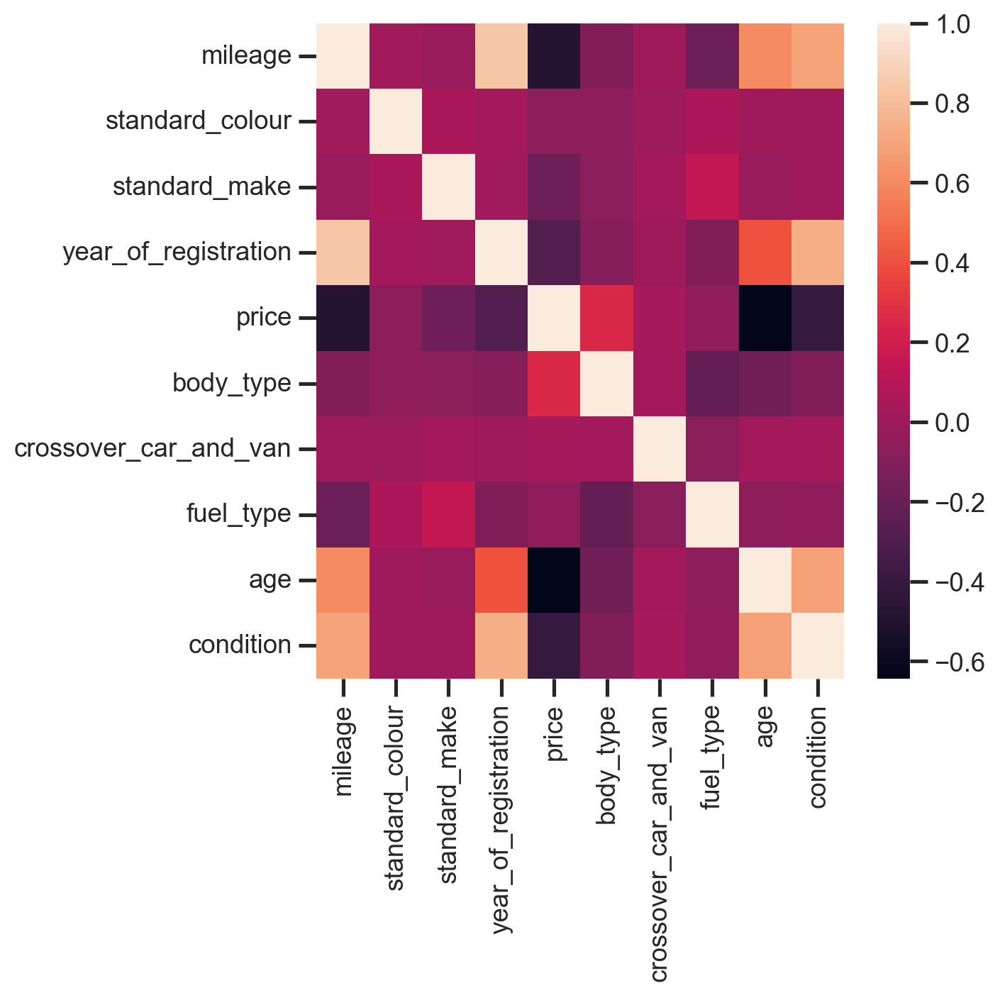

In [116]:
plt.figure(figsize=(6, 6))
sns.heatmap(car_adv.corr(), annot=False)

### 2.3 Subsetting (e.g., Feature Selection, Data Sampling)

* Selecting Features

In [117]:
Brand_new_car = car_adv.loc[car_adv['condition'] == 0]
brand_new_car.shape

(31249, 10)

In [118]:
Fair_car = (car_adv.loc[car_adv['condition'] == 1 ]) 
Fair_car.shape

(351936, 10)

In [119]:
Average_car = car_adv.loc[car_adv['condition'] == 2]
Fair_car.shape

(351936, 10)

In [141]:
Other_car = car_adv.loc[car_adv['condition'] == 3]
Fair_car.shape

(351936, 9)

* Removing Features

In [121]:
brand_new_car = Brand_new_car.drop(labels=['year_of_registration', 'condition'], axis=1)
Fair_car = Fair_car.drop(labels=['condition'], axis=1)
Average_car = Average_car.drop(labels=['condition'], axis=1)
Vintage_car = Other_car.drop(labels=['condition'], axis=1)


* Smapling

In [122]:
sample_data = car_adv.sample(frac=0.1, random_state=50)
sample_data.shape

(40200, 10)

## 3.0 Association and Group Differences Analysis

### 3.1. Quantitative-Quantitative

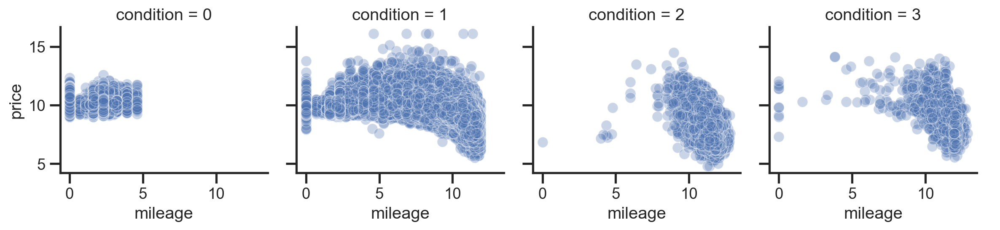

In [123]:
g = sns.FacetGrid(car_adv, col="condition")
g.map(sns.scatterplot, "mileage", "price", alpha=.3)
g.add_legend()

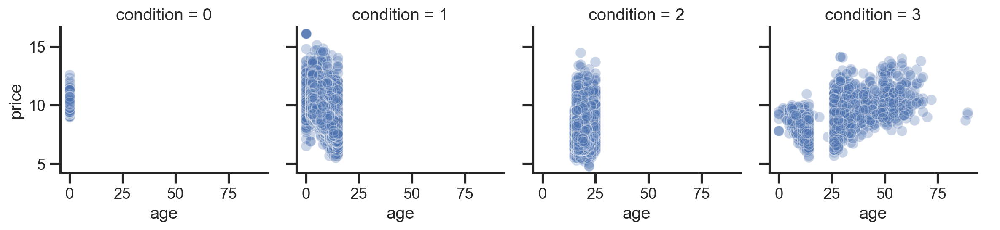

In [124]:
g = sns.FacetGrid(car_adv, col="condition")
g.map(sns.scatterplot, "age", "price", alpha=.3)
g.add_legend()

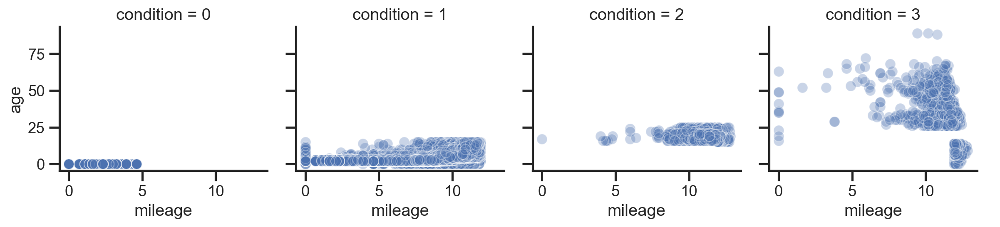

In [125]:
g = sns.FacetGrid(car_adv, col='condition')
g.map(sns.scatterplot, 'mileage', 'age', alpha=.3)
g.add_legend()

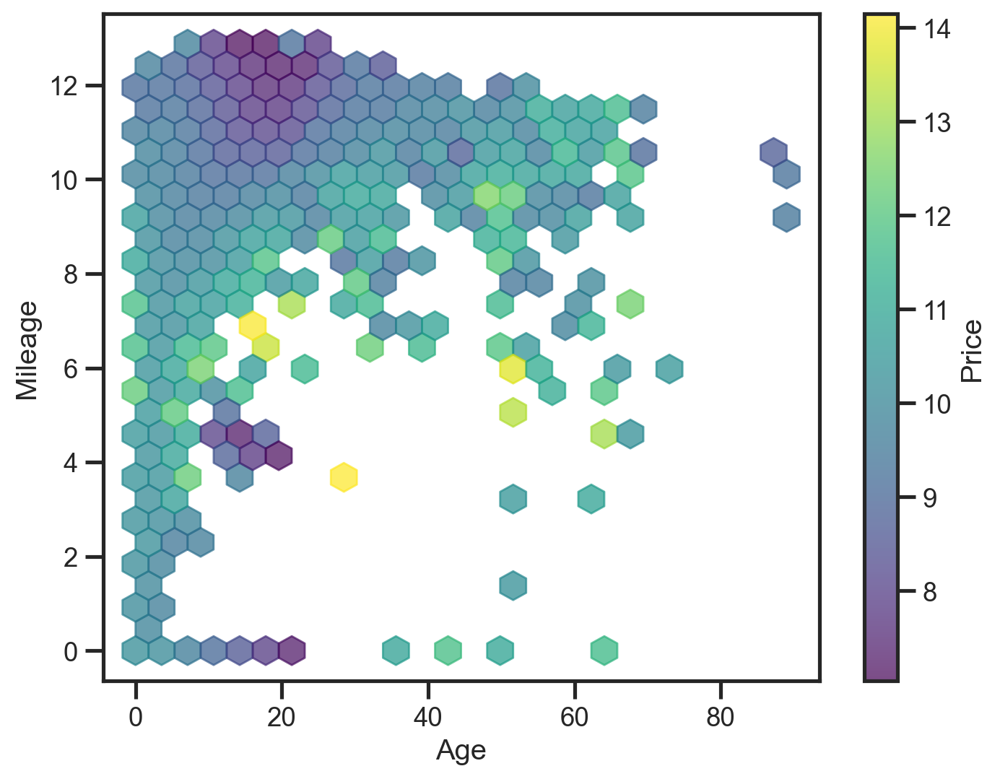

In [126]:
plt.figure(figsize=(8,6))
plt.hexbin(car_adv['age'], car_adv['mileage'], C=car_adv['price'], gridsize=25, cmap='viridis', alpha=0.7)
plt.xlabel('Age')
plt.ylabel('Mileage')
plt.colorbar(label='Price')

### 3.2. Quantitative-Categorical

<AxesSubplot:xlabel='fuel_type', ylabel='mileage'>

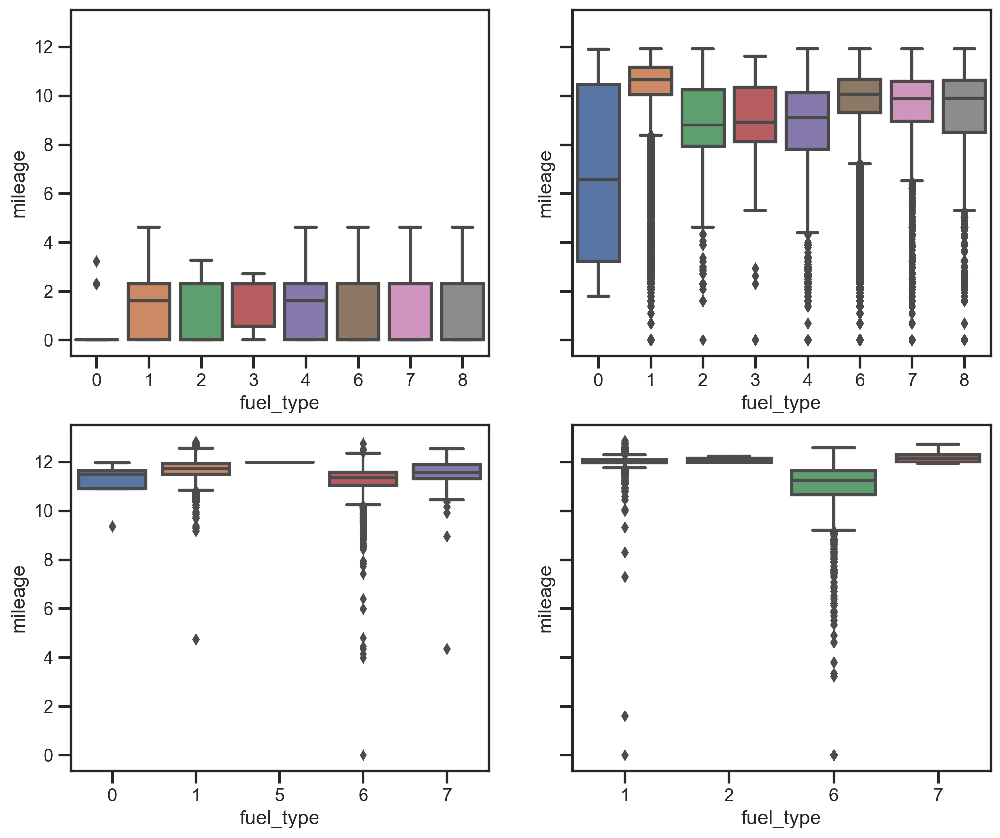

In [127]:
fig, axs = plt.subplots(2, 2, figsize=(12,10), sharey=True)

sns.boxplot(data=Brand_new_car, x='fuel_type', y='mileage', ax=axs[0,0])
sns.boxplot(data=Fair_car, x='fuel_type', y='mileage', ax=axs[0,1])
sns.boxplot(data=Average_car, x='fuel_type', y='mileage', ax=axs[1,0])
sns.boxplot(data=Other_car, x='fuel_type', y='mileage', ax=axs[1,1])

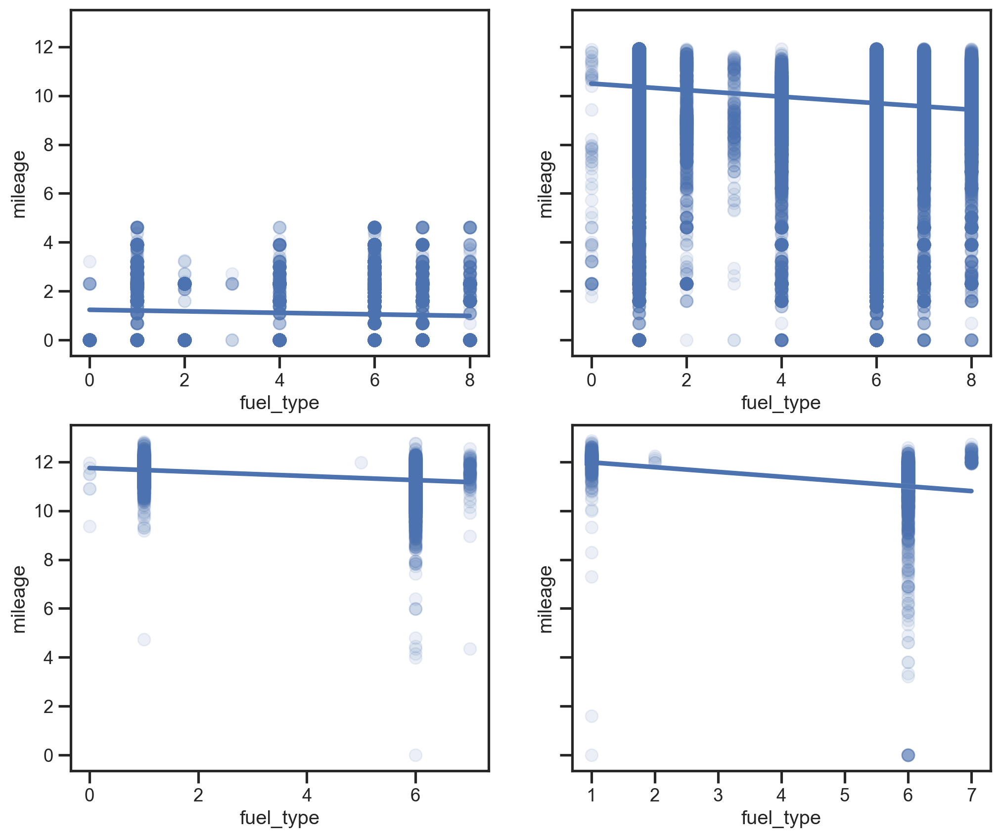

In [128]:
fig, axs = plt.subplots(2, 2, figsize=(12,10), sharey=True)
sns.regplot(data=Brand_new_car, x='fuel_type', y='mileage', ax=axs[0,0], scatter_kws={'alpha': 0.1});
sns.regplot(data=Fair_car, x='fuel_type', y='mileage', ax=axs[0,1], scatter_kws={'alpha': 0.1});
sns.regplot(data=Average_car, x='fuel_type', y='mileage', ax=axs[1,0], scatter_kws={'alpha': 0.1});
sns.regplot(data=Other_car, x='fuel_type', y='mileage', ax=axs[1,1], scatter_kws={'alpha': 0.1});

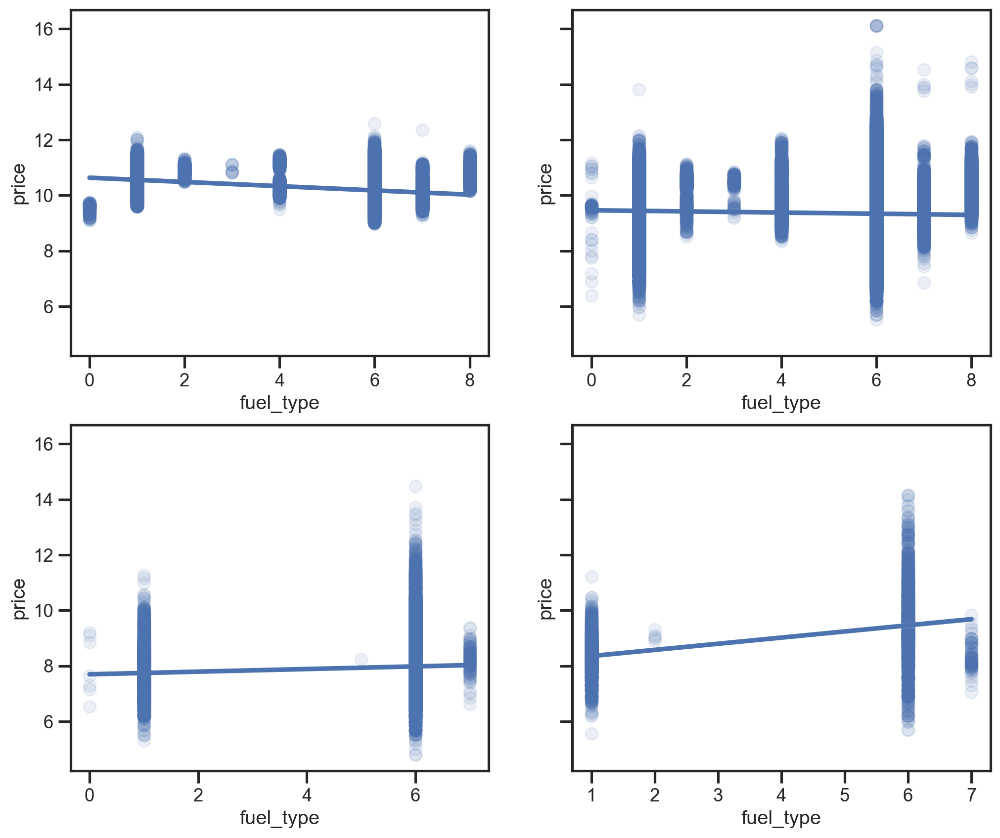

In [129]:
fig, axs = plt.subplots(2, 2, figsize=(12,10), sharey=True)
sns.regplot(data=Brand_new_car, x='fuel_type', y='price', ax=axs[0,0], scatter_kws={'alpha': 0.1});
sns.regplot(data=Fair_car, x='fuel_type', y='price', ax=axs[0,1], scatter_kws={'alpha': 0.1});
sns.regplot(data=Average_car, x='fuel_type', y='price', ax=axs[1,0], scatter_kws={'alpha': 0.1});
sns.regplot(data=Other_car, x='fuel_type', y='price', ax=axs[1,1], scatter_kws={'alpha': 0.1});


<AxesSubplot:xlabel='standard_make', ylabel='price'>

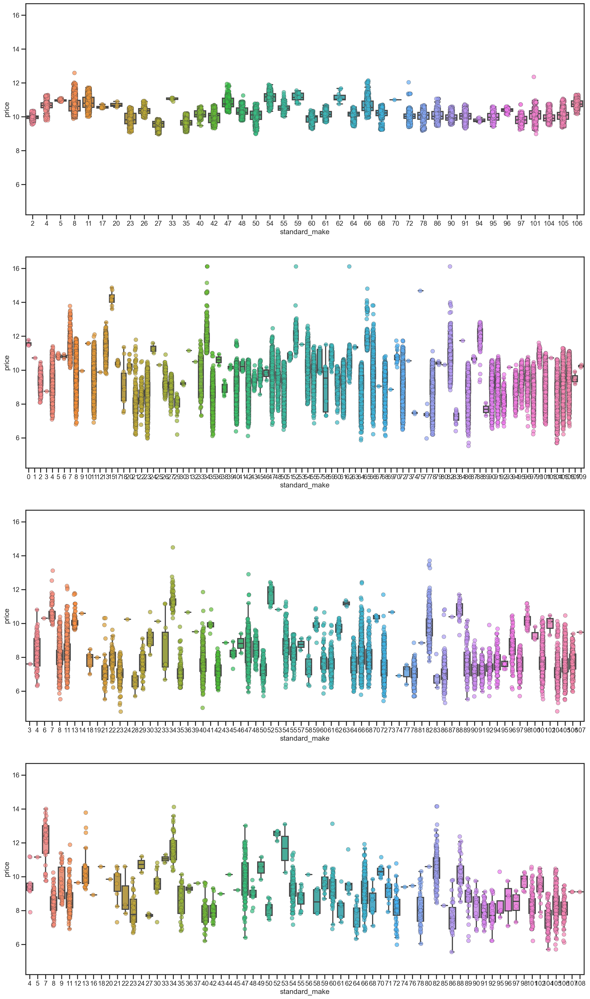

In [130]:
fig, axs = plt.subplots(4, 1, figsize=(20,35), sharey=True)
sns.boxplot(data=Brand_new_car, x='standard_make', y='price', ax=axs[0], showfliers=False)
sns.stripplot(data=Brand_new_car, x='standard_make', y='price', ax=axs[0], linewidth=0.5, jitter=0.1, size=8, alpha=0.7)

sns.boxplot(data=Fair_car, x='standard_make', y='price', ax=axs[1], showfliers=False)
sns.stripplot(data=Fair_car, x='standard_make', y='price', ax=axs[1], linewidth=0.5, jitter=0.1, size=8, alpha=0.7)

sns.boxplot(data=Average_car, x='standard_make', y='price', ax=axs[2], showfliers=False)
sns.stripplot(data=Average_car, x='standard_make', y='price', ax=axs[2], linewidth=0.5, jitter=0.1, size=8, alpha=0.7)

sns.boxplot(data=Other_car, x='standard_make', y='price', ax=axs[3], showfliers=False)
sns.stripplot(data=Other_car, x='standard_make', y='price', ax=axs[3], linewidth=0.5, jitter=0.1, size=8, alpha=0.7)
            

<AxesSubplot:xlabel='body_type', ylabel='price'>

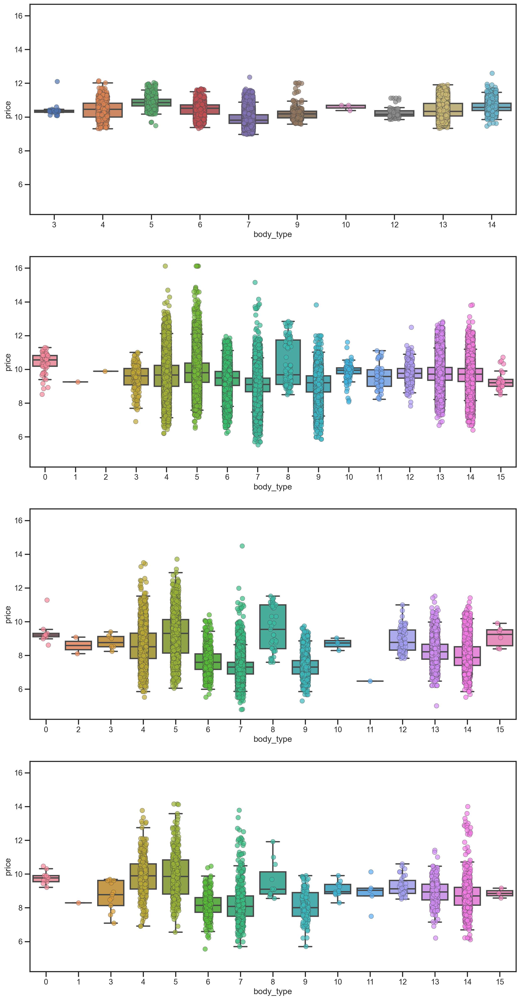

In [131]:
fig, axs = plt.subplots(4, 1, figsize=(15,30), sharey=True)
sns.boxplot(data=Brand_new_car, x='body_type', y='price', ax=axs[0], showfliers=False)
sns.stripplot(data=Brand_new_car, x='body_type', y='price', ax=axs[0], linewidth=0.5, jitter=0.1, size=8, alpha=0.7)

sns.boxplot(data=Fair_car, x='body_type', y='price', ax=axs[1], showfliers=False)
sns.stripplot(data=Fair_car, x='body_type', y='price', ax=axs[1], linewidth=0.5, jitter=0.1, size=8, alpha=0.7)

sns.boxplot(data=Average_car, x='body_type', y='price', ax=axs[2], showfliers=False)
sns.stripplot(data=Average_car, x='body_type', y='price', ax=axs[2], linewidth=0.5, jitter=0.1, size=8, alpha=0.7)

sns.boxplot(data=Other_car, x='body_type', y='price', ax=axs[3], showfliers=False)
sns.stripplot(data=Other_car, x='body_type', y='price', ax=axs[3], linewidth=0.5, jitter=0.1, size=8, alpha=0.7)
            


### 3.3. Categorical-Categorical

<AxesSubplot:xlabel='standard_make', ylabel='price'>

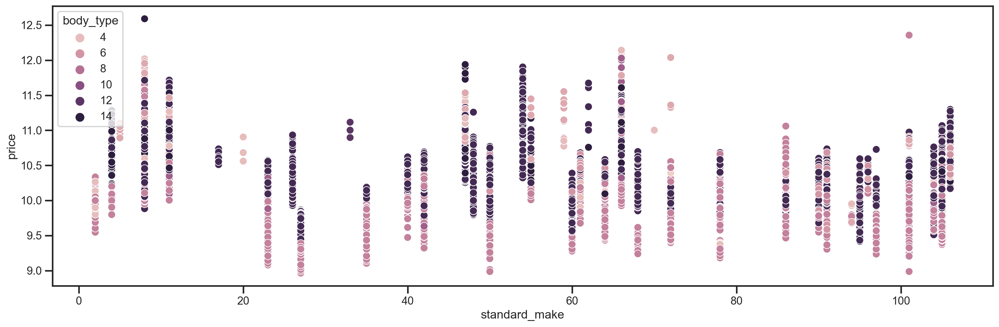

In [132]:
plt.figure(figsize=(20, 6))
sns.scatterplot(x='standard_make', y='price', hue='body_type', data=Brand_new_car)

<AxesSubplot:xlabel='standard_make', ylabel='price'>

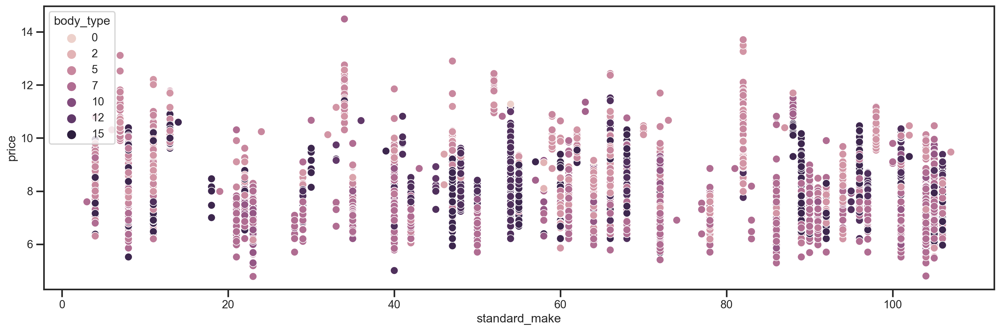

In [139]:
plt.figure(figsize=(20, 6))
sns.scatterplot(x='standard_make', y='price', hue='body_type', 
                data=Average_car)

<AxesSubplot:xlabel='standard_make', ylabel='price'>

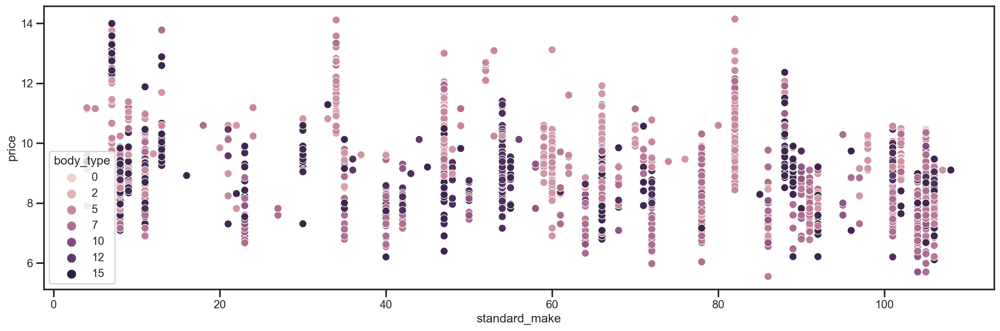

In [142]:
plt.figure(figsize=(20, 6))
sns.scatterplot(x='standard_make', y='price', hue='body_type', 
                data=Other_car)

<AxesSubplot:xlabel='fuel_type', ylabel='condition'>

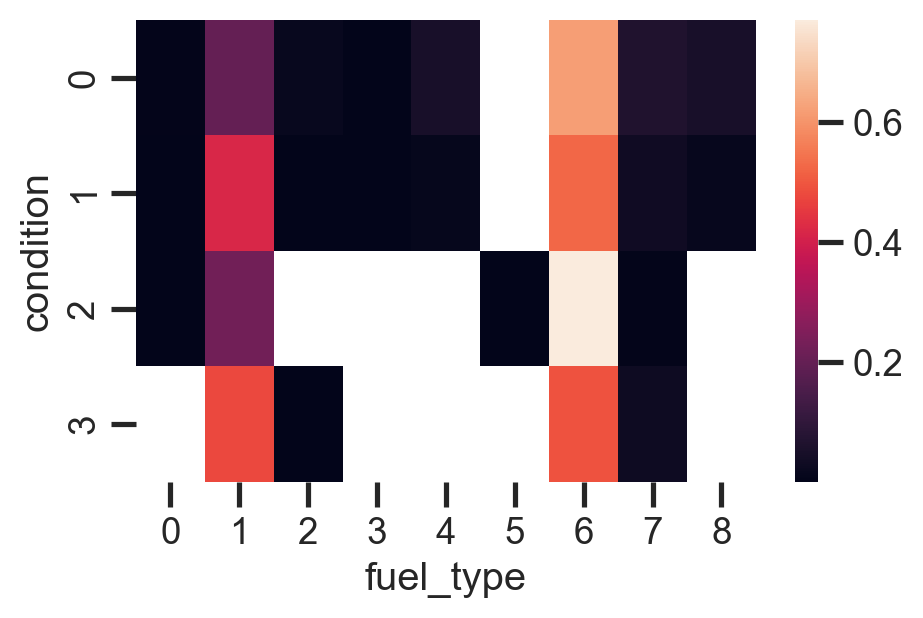

In [133]:
sns.heatmap((car_adv.value_counts(['fuel_type', 'condition']) / car_adv.value_counts(['condition'])).unstack())

<AxesSubplot:xlabel='body_type', ylabel='condition'>

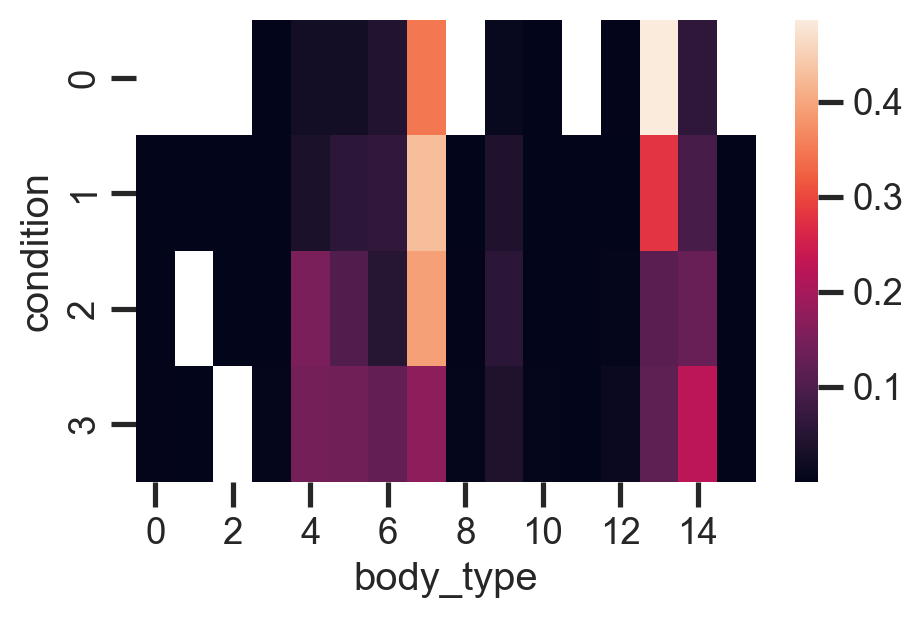

In [134]:
sns.heatmap((car_adv.value_counts(['body_type', 'condition']) / car_adv.value_counts(['condition'])).unstack())

<AxesSubplot:xlabel='standard_make', ylabel='condition'>

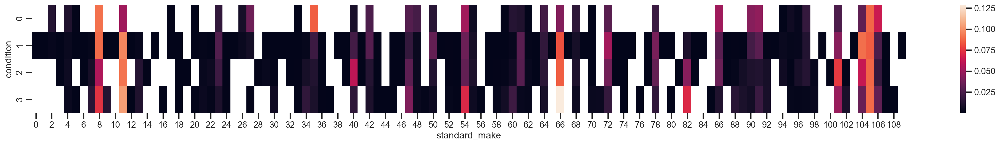

In [135]:
plt.figure(figsize=(30, 3))
sns.heatmap((car_adv.value_counts(['standard_make', 'condition']) / car_adv.value_counts(['condition'])).unstack())

<AxesSubplot:xlabel='standard_colour', ylabel='condition'>

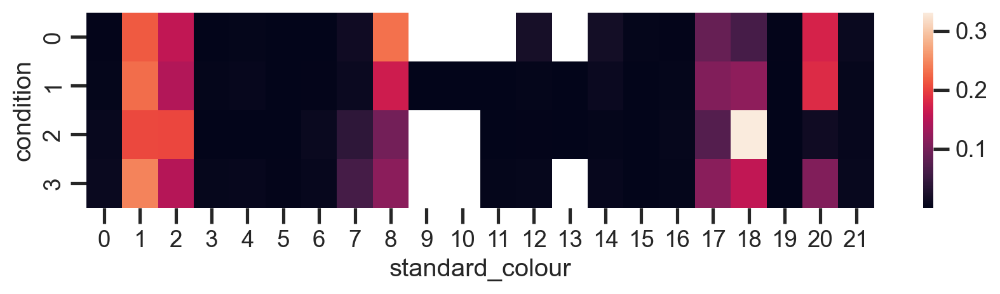

In [136]:
plt.figure(figsize=(10, 2))
sns.heatmap((car_adv.value_counts(['standard_colour', 'condition']) / car_adv.value_counts(['condition'])).unstack())

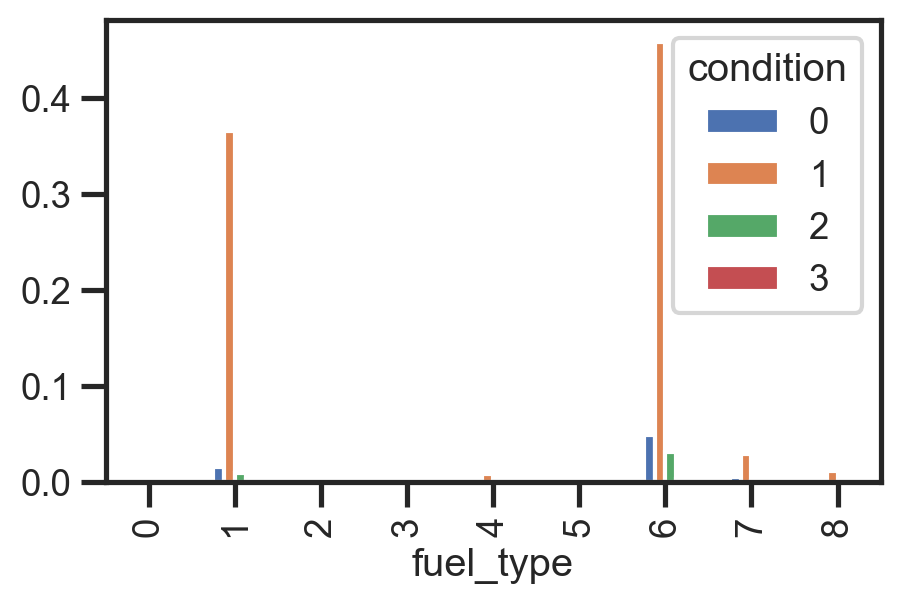

In [137]:
car_adv.value_counts(['fuel_type','condition'], normalize=True).unstack().plot.bar();

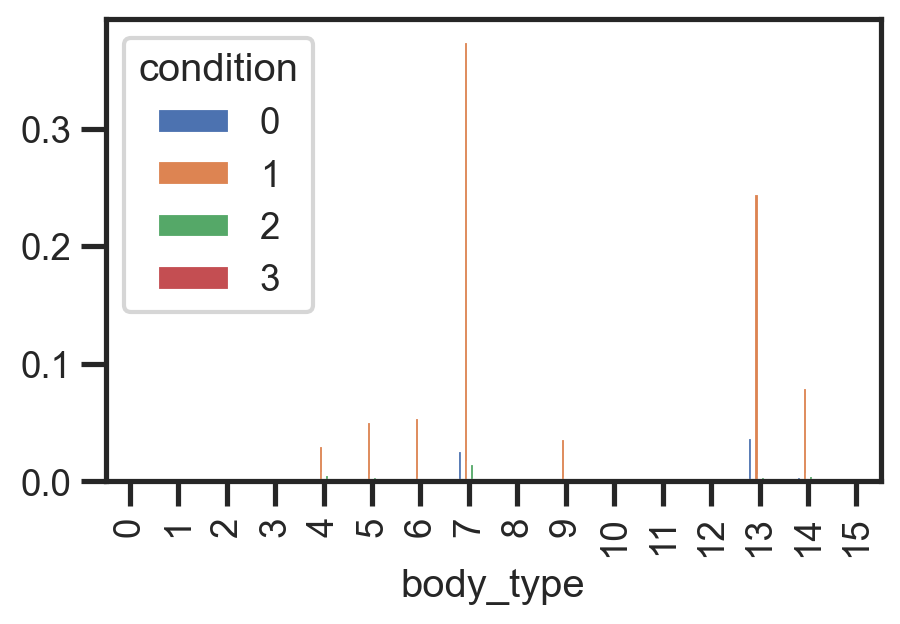

In [138]:
car_adv.value_counts(['body_type','condition'], normalize=True).unstack().plot.bar();